# **Neighbor Analysis**

Breast cancer is a heterogeneous disease characterized by multiple cellular and molecular subtypes. Spatial transcriptomics technologies provide a unique opportunity to analyze not only tumor cells, but also the spatial context in which they reside, including their interactions with the surrounding microenvironment.

In this notebook, I focus on a detailed analysis of the spatial neighbors of epithelial cells classified as:
- **Normal**
- **Malignant**
- **Unknown**

The main objective is to understand whether the *Unknown* category arises from:
- a technical spillover effect,
- a complex microenvironment,
- or hybrid/ambiguous cellular entities that are not yet well defined biologically.

The main analyses include:
- Defining cellular neighbors using the KDTree algorithm.
- Assessing contamination: presence of non-epithelial cells among the neighbors.
- Transcriptomic characterization of contaminated *Unknown* cells.
- Clustering analysis to identify coherent subgroups.

## Library Imports

Importing necessary libraries for spatial analysis, data processing, statistics, and visualization.


In [6]:
import numpy as np
import pandas as pd
import scanpy as sc
import spatialdata as sd

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns

from collections import Counter
from sklearn.neighbors import KDTree
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, chi2_contingency

## Dataset Loading

Loading the datasets used for the analysis:  
- **xenium**: the full spatial transcriptomics dataset.  
- **epithelial_cells**: the anndata object from *xenium* containing only epithelial cells.  
- **classification_df**: a dataframe providing cell type classifications for the sample.

In [13]:
xenium = sd.read_zarr("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC.zarr")

In [14]:
epithelial_cells = sc.read_h5ad("epithelial_cells_cell_type_prediction_filtered.h5ad")

In [15]:
classification_df = pd.read_csv('/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_cell_types.csv')

## Initial Visualization of Cell Type Distribution

I combine spatial coordinates and cell annotations to:
- Visualize the spatial distribution of different cell types.
- Quantify the relative frequency of the various cell populations.

This step provides an overall overview of the spatial context, useful for undertaking subsequent neighbor analyses.

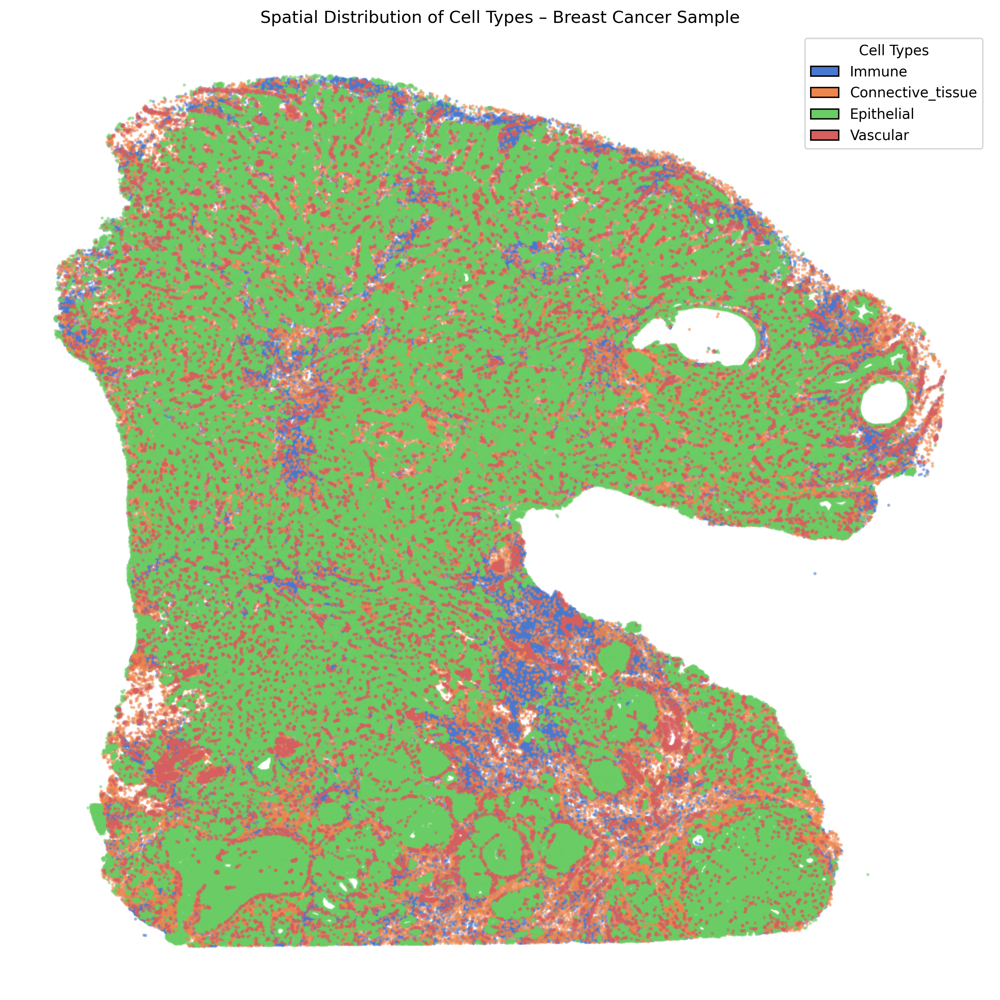

level1
Epithelial           350729
Immune               108207
Connective_tissue     79347
Vascular              36569
Name: count, dtype: int64

In [16]:
merged_obs = pd.merge(
    xenium.table.obs, 
    classification_df, 
    on="cell_id",  
    how="left")

xenium.table.obs = merged_obs

# Copy data into a DataFrame
cell_geometries = xenium.table.obs.copy()

# Spatial coordinates
coords = pd.DataFrame(xenium.table.obsm['spatial'], index=cell_geometries.index, columns=['x','y'])
cell_geometries = cell_geometries.join(coords)

# Cell types
celltypes = cell_geometries['level1'].unique()

# More suitable palette: Seaborn "colorblind" or "muted"
palette = sns.color_palette("muted", len(celltypes))
color_dict = dict(zip(celltypes, palette))

# Visualization
fig, ax = plt.subplots(figsize=(10,10), dpi=300)
for celltype, color in color_dict.items():
    subset = cell_geometries[cell_geometries['level1'] == celltype]
    subset.plot.scatter(x='x', y='y', ax=ax, color=color, s=2, alpha=0.4)

# Legend
legend_elements = [Patch(facecolor=color, edgecolor='k', label=celltype) for celltype, color in color_dict.items()]
ax.legend(handles=legend_elements, title="Cell Types", loc="upper right")

plt.title("Spatial Distribution of Cell Types – Breast Cancer Sample")
plt.axis("off")
ax.set_ylim(ax.get_ylim()[::-1])
plt.tight_layout()
plt.show()

xenium.table.obs['level1'].value_counts()

# Neighbor Contamination Analysis

In this section, we define spatial neighbors and assess cell contamination:
- For each epithelial cell, the 5 nearest neighbors (excluding the cell itself) are identified using KDTree.
- A cell is considered contaminated if at least one of its neighbors is non-epithelial.
- A cell is considered “clean” if all neighbors are epithelial.

I analyzed the composition of contaminating neighbors for the three groups (Unknown, Normal, Malignant), including visualizations and statistical tests.

Main results:
- Unknown cells are the most contaminated (~46%).
- Malignant cells are the least contaminated (~29%).
- The differences between groups are statistically significant (χ² test, p < 0.001).

In [5]:
# xenium_table and classification_df have 'cell_id' as a column, which I set as the index
xenium_table = xenium.tables["table"].obs.set_index("cell_id")
classification_df = classification_df.set_index("cell_id")
epithelial_obs = epithelial_cells.obs.set_index("cell_id")

# cell_geometries already has 'cell_id' as the index
cell_geometries = xenium.shapes["cell_circles"].copy()

# Add level1/level2 classifications
xenium_table = xenium_table.join(classification_df[["level1", "level2"]], how="left")
# Add cell_type prediction
xenium_table["cell_type_prediction"] = epithelial_obs["cell_type_prediction"].reindex(xenium_table.index)

Unknown: 1981/4311 contaminated → 45.95%
Normal: 10028/25245 contaminated → 39.72%
Malignant: 92085/319136 contaminated → 28.85%


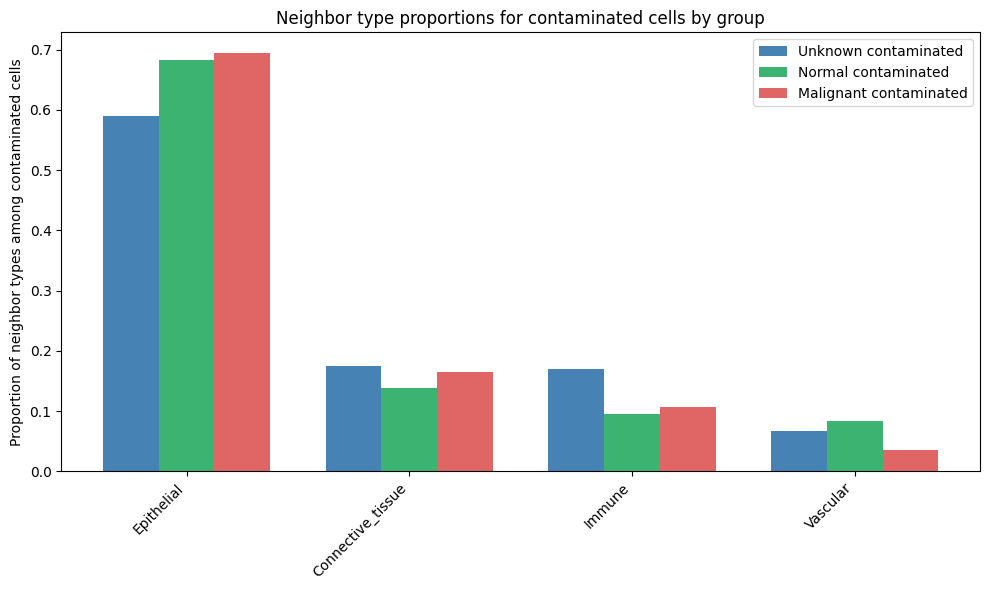


Contingency table (absolute counts) of neighbor types for contaminated cells:
                     Unknown  Normal  Malignant
neighbor_cell_types                            
Epithelial              5838   34229     319499
Connective_tissue       1728    6964      75683
Immune                  1680    4758      49168
Vascular                 659    4189      16075

Comparison Unknown vs Normal: chi2=640.41, p=1.748e-138


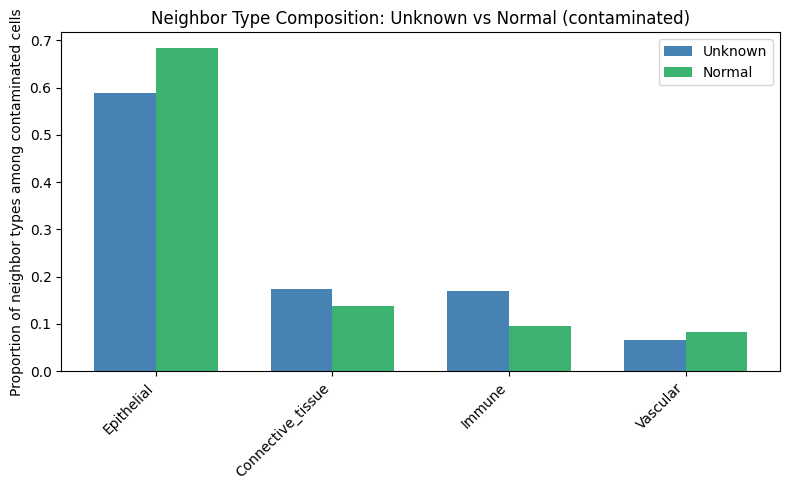


Comparison Unknown vs Malignant: chi2=785.57, p=5.835e-170


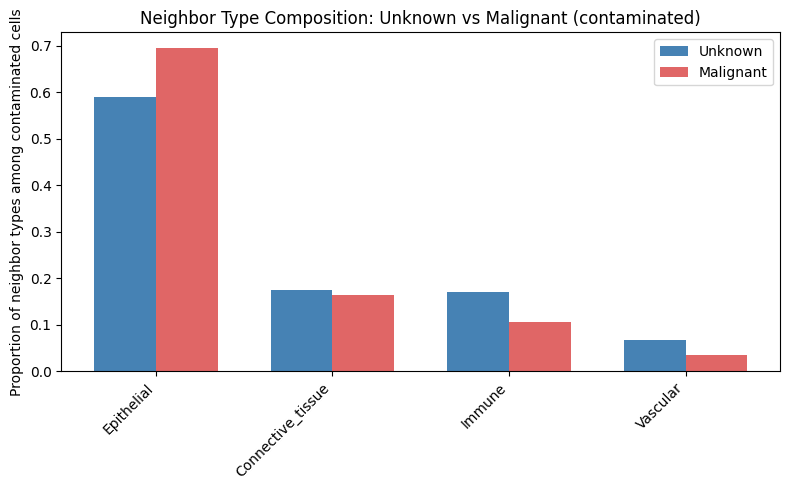


Comparison Normal vs Malignant: chi2=2944.73, p=0.000e+00


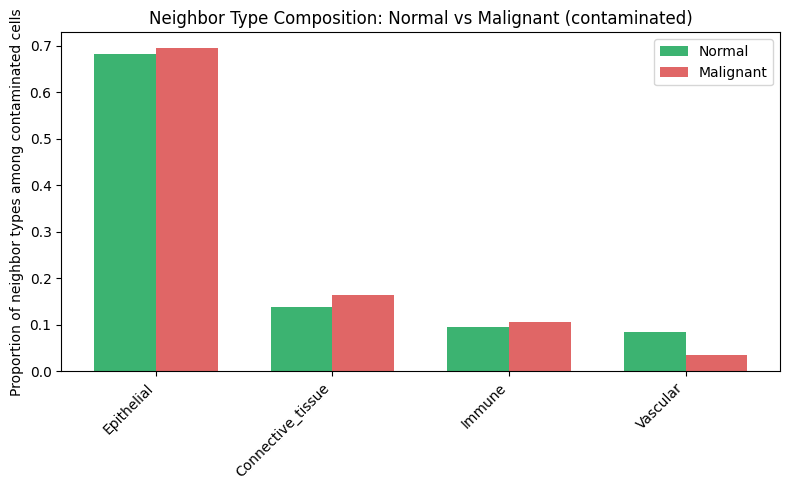


Summary of chi-square test p-values:
Unknown vs Normal: p = 1.748e-138 → SIGNIFICANT
Unknown vs Malignant: p = 5.835e-170 → SIGNIFICANT
Normal vs Malignant: p = 0.000e+00 → SIGNIFICANT


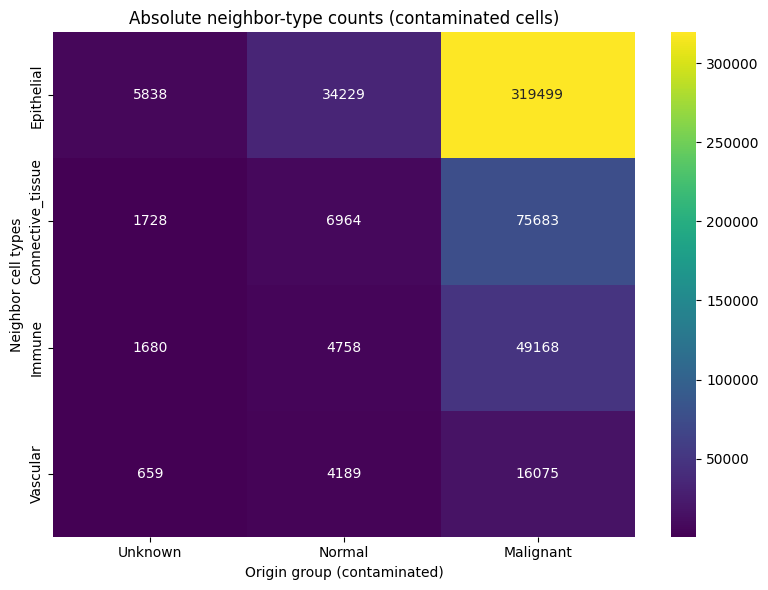

In [6]:
colors = {
    "Unknown": "#4682B4",   
    "Normal": "#3CB371",   
    "Malignant": "#E06666"}

# Function to build neighbors DataFrame
def build_neighbors_df(cell_ids, cell_type_name, xenium_table, cell_geometries, k=6):
    geoms = cell_geometries.loc[cell_ids].copy()
    coords = np.stack([geoms.geometry.centroid.x.values, geoms.geometry.centroid.y.values], axis=1)

    all_coords = np.stack([cell_geometries.geometry.centroid.x.values, cell_geometries.geometry.centroid.y.values], axis=1)
    all_ids = cell_geometries.index.to_numpy()

    tree = KDTree(all_coords)
    dists, neighbor_indices = tree.query(coords, k=k)

    rows = []
    for i, c_id in enumerate(geoms.index):
        neighs = all_ids[neighbor_indices[i]]
        neighs = neighs[neighs != c_id][:5].tolist()  # exclude the cell itself, keep max 5 neighbors
        neigh_types = xenium_table.reindex(neighs)["level1"].tolist()
        type_counts = Counter(neigh_types)
        contaminated = any(t != "Epithelial" for t in neigh_types)

        rows.append({
            "cell_id": c_id,
            "neighbor_cell_ids": neighs,
            "neighbor_cell_types": neigh_types,
            "neighbor_type_counts": dict(type_counts),
            "contaminated": contaminated})

    df = pd.DataFrame(rows)
    total = len(df)
    num_contam = df["contaminated"].sum()
    pct = (num_contam / total * 100) if total > 0 else 0.0
    print(f"{cell_type_name}: {num_contam}/{total} contaminated → {pct:.2f}%")

    return df

# Build neighbors DataFrames for groups
unknown_ids = xenium_table.query("cell_type_prediction == 'Unknown'").index.tolist()
normal_ids = xenium_table.query("cell_type_prediction == 'Normal'").index.tolist()
malignant_ids = xenium_table.query("cell_type_prediction == 'Malignant'").index.tolist()

neighbors_dfs = {
    "Unknown": build_neighbors_df(unknown_ids, "Unknown", xenium_table, cell_geometries, k=6),
    "Normal": build_neighbors_df(normal_ids, "Normal", xenium_table, cell_geometries, k=6),
    "Malignant": build_neighbors_df(malignant_ids, "Malignant", xenium_table, cell_geometries, k=6)}

# Save as parquet files
for grp, df in neighbors_dfs.items():
    df.to_parquet(f"neighbors_{grp.lower()}.parquet")

# Analyze contamination proportions
cont_props = {}
for grp, df in neighbors_dfs.items():
    contaminated = df[df["contaminated"]]
    exploded = contaminated["neighbor_cell_types"].explode()
    freq = exploded.value_counts(normalize=True)
    cont_props[grp] = freq

contingency_props = pd.DataFrame(cont_props).fillna(0)

plt.figure(figsize=(10,6))
width = 0.25
types = contingency_props.index.tolist()
x = np.arange(len(types))

plt.bar(x - width, contingency_props["Unknown"].reindex(types, fill_value=0), width, 
        label="Unknown contaminated", color=colors["Unknown"])
plt.bar(x, contingency_props["Normal"].reindex(types, fill_value=0), width, 
        label="Normal contaminated", color=colors["Normal"])
plt.bar(x + width, contingency_props["Malignant"].reindex(types, fill_value=0), width, 
        label="Malignant contaminated", color=colors["Malignant"])

plt.xticks(x, types, rotation=45, ha="right")
plt.ylabel("Proportion of neighbor types among contaminated cells")
plt.title("Neighbor type proportions for contaminated cells by group")
plt.legend()
plt.tight_layout()
plt.show()

# Contingency table with absolute counts
cont_abs = {}
for grp, df in neighbors_dfs.items():
    exploded = df[df["contaminated"]]["neighbor_cell_types"].explode()
    cont_abs[grp] = exploded.value_counts()

contingency_abs = pd.DataFrame(cont_abs).fillna(0).astype(int)
print("\nContingency table (absolute counts) of neighbor types for contaminated cells:")
print(contingency_abs)

# Chi-square comparisons
def compare_groups_chi2(cont_abs_df, group1, group2, min_count=5):
    sub = cont_abs_df[[group1, group2]].copy()
    valid = (sub[group1] + sub[group2]) >= min_count
    sub = sub[valid]

    if sub.shape[0] < 2:
        print(f"Too few categories with >= {min_count} counts for comparison {group1} vs {group2}")
        return None, None

    chi2, p, dof, expected = chi2_contingency(sub)
    print(f"\nComparison {group1} vs {group2}: chi2={chi2:.2f}, p={p:.3e}")

    sub_norm = sub.div(sub.sum(axis=0), axis=1)
    types2 = sub_norm.index.tolist()
    x2 = np.arange(len(types2))
    width2 = 0.35

    fig, ax = plt.subplots(figsize=(8,5))
    ax.bar(x2 - width2/2, sub_norm[group1], width2, 
           label=group1, color=colors[group1])
    ax.bar(x2 + width2/2, sub_norm[group2], width2, 
           label=group2, color=colors[group2])
    ax.set_xticks(x2)
    ax.set_xticklabels(types2, rotation=45, ha="right")
    ax.set_ylabel("Proportion of neighbor types among contaminated cells")
    ax.set_title(f"Neighbor Type Composition: {group1} vs {group2} (contaminated)")
    ax.legend()
    plt.tight_layout()
    plt.show()

    return chi2, p

pvals = {}
for g1, g2 in [("Unknown", "Normal"), ("Unknown", "Malignant"), ("Normal", "Malignant")]:
    _, p = compare_groups_chi2(contingency_abs, g1, g2, min_count=5)
    pvals[f"{g1} vs {g2}"] = p

print("\nSummary of chi-square test p-values:")
for pair, p in pvals.items():
    status = "SIGNIFICANT" if (p is not None and p < 0.05) else "not significant"
    print(f"{pair}: p = {p:.3e} → {status}")

# Final heatmap
plt.figure(figsize=(8,6))
sns.heatmap(contingency_abs, annot=True, fmt="d", cmap="viridis")
plt.title("Absolute neighbor-type counts (contaminated cells)")
plt.ylabel("Neighbor cell types")
plt.xlabel("Origin group (contaminated)")
plt.tight_layout()
plt.show()

# Transcriptomic Characterization of Unknown Contaminated Cells

To investigate the nature of the Unknown contaminated cells, two main comparisons are performed:
- Unknown contaminated vs Unknown clean.
- Unknown contaminated vs epithelial neighbors.

To this end, two separate AnnData objects are created for differential gene expression (DGE) analysis, aiming to explore whether the contamination is due to technical spillover or represents a mixed biological identity.

In [7]:
# Data Preparation
epithelial_cells.raw = epithelial_cells.copy()
epithelial_cells.obs_names = epithelial_cells.obs_names.astype(str)
epithelial_cells.obs["cell_id"] = epithelial_cells.obs.index.astype(str)

# Definition of clean and contaminated groups
contaminated_unknown_ids = neighbors_dfs["Unknown"][neighbors_dfs["Unknown"]["contaminated"]].index.astype(str).tolist()
clean_unknown_ids = neighbors_dfs["Unknown"][~neighbors_dfs["Unknown"]["contaminated"]].index.astype(str).tolist()

print(f"Number of Unknown contaminated: {len(contaminated_unknown_ids)}")
print(f"Number of Unknown clean: {len(clean_unknown_ids)}")

# Extraction of neighbors of contaminated cells
neighbor_ids = set()
for _, row in neighbors_dfs["Unknown"][neighbors_dfs["Unknown"]["contaminated"]].iterrows():
    neighbor_ids.update([str(n) for n in row["neighbor_cell_ids"]])

neighbor_ids = [cid for cid in neighbor_ids if cid in epithelial_cells.obs["cell_id"].values]
print(f"Number of unique neighbors of contaminated cells: {len(neighbor_ids)}")

# Creation of AnnData objects with subgroups

# --- Contaminated vs Clean ---
mask = epithelial_cells.obs["cell_id"].isin(contaminated_unknown_ids + clean_unknown_ids)
adata_contam_clean = epithelial_cells[mask].copy()

# Add 'group' column
adata_contam_clean.obs["group"] = [
    "contaminated" if cid in contaminated_unknown_ids else "clean"
    for cid in adata_contam_clean.obs["cell_id"]]

# --- Contaminated vs Neighbors ---
subset_ids = list(contaminated_unknown_ids) + list(neighbor_ids)
mask_neighbors = epithelial_cells.obs["cell_id"].isin(subset_ids)
adata_contam_neighbors = epithelial_cells[mask_neighbors].copy()

# Add 'group' column
adata_contam_neighbors.obs["group"] = [
    "contaminated" if cid in contaminated_unknown_ids else "neighbor"
    for cid in adata_contam_neighbors.obs["cell_id"]]

print(f"Cells in adata_contam_clean: {adata_contam_clean.n_obs}")
print(f"Cells in adata_contam_neighbors: {adata_contam_neighbors.n_obs}")

Numero di Unknown contaminated: 1981
Numero di Unknown clean: 2330
Numero di vicini unici delle contaminate: 5661
Cells in adata_contam_clean: 2648
Cells in adata_contam_neighbors: 6840


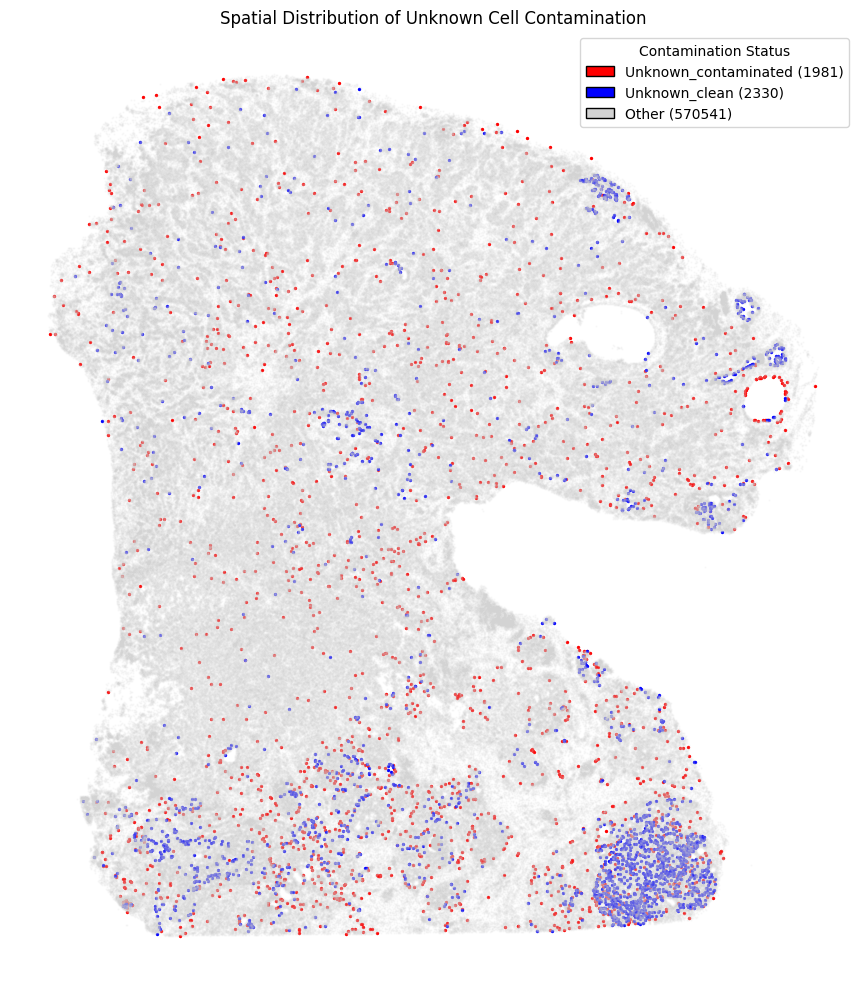

In [33]:
# Initialize column
cell_geometries["contamination_status"] = "Other"

# Select only Unknown cells
contaminated_unknown_ids = neighbors_dfs["Unknown"][neighbors_dfs["Unknown"]["contaminated"]]["cell_id"]
clean_unknown_ids = neighbors_dfs["Unknown"][~neighbors_dfs["Unknown"]["contaminated"]]["cell_id"]

# Keep only IDs present in cell_geometries
contaminated_unknown_ids = contaminated_unknown_ids[contaminated_unknown_ids.isin(cell_geometries.index)]
clean_unknown_ids = clean_unknown_ids[clean_unknown_ids.isin(cell_geometries.index)]

# Update status
cell_geometries.loc[contaminated_unknown_ids, "contamination_status"] = "Unknown_contaminated"
cell_geometries.loc[clean_unknown_ids, "contamination_status"] = "Unknown_clean"

# Spatial visualization
# Count cells per group
counts = cell_geometries["contamination_status"].value_counts()

fig, ax = plt.subplots(figsize=(10, 10))

colors = {
    "Unknown_contaminated": "red",
    "Unknown_clean": "blue",
    "Other": "lightgrey"}

for status, color in colors.items():
    subset = cell_geometries[cell_geometries["contamination_status"] == status]
    if status != "Other":
        subset.plot(ax=ax, color=color, markersize=2, alpha=1)
    else:
        subset.plot(ax=ax, color=color, markersize=0.5, alpha=0.1)

# Create legend with counts
from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor=color, edgecolor='k', label=f"{status} ({counts.get(status, 0)})")
    for status, color in colors.items()]

ax.legend(handles=legend_elements, title="Contamination Status", loc="upper right")
plt.title("Spatial Distribution of Unknown Cell Contamination")
plt.axis("off")
ax.set_ylim(ax.get_ylim()[::-1])
plt.tight_layout()
plt.show()

# Differential Gene Expression (DGE)

Differential gene expression (DGE) analysis was performed for two main comparisons:
- Contaminated vs Clean: key genes include MYBPC1, CXCL12, ANKRD30A.
- Contaminated vs Neighbors: key genes include MYBPC1, TPD52, PGR, AQP3, FASN.

The Unknown contaminated cells show a distinct expression profile and maintain an epithelial identity, suggesting that they are not simply randomly contaminated but represent a biologically distinct subgroup.

In [8]:
# DGE analyses
print("\n=== DGE 1: Contaminated vs Clean ===")
sc.tl.rank_genes_groups(adata_contam_clean, "group", method="wilcoxon", use_raw=True)
dge_contam_clean = sc.get.rank_genes_groups_df(adata_contam_clean, group="contaminated")
print(dge_contam_clean.head(5))

print("\n=== DGE 2: Contaminated vs Neighbors ===")
sc.tl.rank_genes_groups(adata_contam_neighbors, "group", method="wilcoxon", use_raw=True)
dge_contam_neighbors = sc.get.rank_genes_groups_df(adata_contam_neighbors, group="contaminated")
print(dge_contam_neighbors.head(5))


=== DGE 1: Contaminated vs Clean ===
      names    scores  logfoldchanges     pvals  pvals_adj
0    MYBPC1  3.491919        0.171854  0.000480   0.033569
1    CXCL12  3.156568        0.489612  0.001596   0.089397
2  ANKRD30A  2.697752        0.118317  0.006981   0.325777
3      FLNB  2.601948        0.102505  0.009270   0.370783
4     RAB30  2.462981        0.220197  0.013779   0.482256

=== DGE 2: Contaminated vs Neighbors ===
    names     scores  logfoldchanges          pvals     pvals_adj
0  MYBPC1  21.435577        1.203433  6.225794e-102  1.743222e-99
1   TPD52  18.778885        0.816959   1.124179e-78  1.573851e-76
2     PGR  17.730852        0.920729   2.423325e-70  2.261770e-68
3    AQP3  16.077469        1.288239   3.670736e-58  2.569515e-56
4    FASN  15.285273        0.840230   9.586059e-53  4.473494e-51


# Epithelial Marker Expression
Analysis of key epithelial markers (e.g., KRT8, CDH1) in the Unknown contaminated cells:
- Contaminated cells exhibit clear expression of epithelial markers.
- However, their expression profiles differ from those observed in clean epithelial cells.

These findings suggest that the contaminated cells are indeed epithelial in origin but may represent distinct functional or transitional states, possibly influenced by interactions with the surrounding microenvironment.

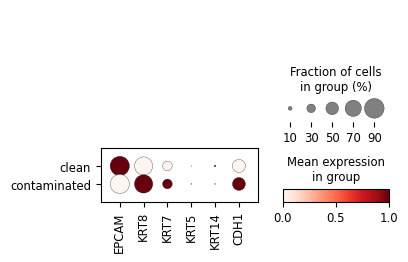

In [9]:
epithelial_markers = [
    "EPCAM",     # EpCAM: classic epithelial marker, overexpressed in many tumors
    "KRT8",      # Keratin 8: simple epithelial cells
    "KRT18",     # Keratin 18
    "KRT19",     # Keratin 19: overexpressed in IDC
    "KRT7",      # Expressed in normal and tumor mammary glands
    "KRT5",      # Expressed in basal/triple-negative tumors
    "KRT14",     # Typical of basal tumors
    "CDH1",      # E-cadherin: lost in EMT (but present in differentiated epithelial cells)
    "MUC1",      # Overexpressed in IDC and other epithelial neoplasms
    "CLDN3",     # Claudin-3: tight junctions, upregulated in many tumors
    "CLDN4",     # Claudin-4
    "CLDN7",     # Claudin-7
    "OCLN",      # Occludin
    "TJP1",      # ZO-1
    "CEACAM5",   # Carcinoembryonic antigen, relevant in ductal tumors
    "SFN",       # Involved in p53 signaling in epithelial cells
    "GRHL2",     # Epithelial regulator that inhibits EMT
    "DSG3",      # Desmoglein 3: epithelial desmosomes
    "ANXA1",     # Annexin A1: overexpressed in aggressive IDC
]

present_markers = [g for g in epithelial_markers if g in adata_contam_clean.raw.var_names]

sc.pl.dotplot(
    adata_contam_clean,
    var_names=present_markers,
    groupby="group",
    use_raw=True,
    standard_scale="var")

# Clustering delle Unknown Contaminate
The Unknown contaminated cells were clustered to identify the presence of homogeneous subgroups. Five clusters with distinctive markers were identified:
- Cluster 2: High levels of LUM, indicative of fibroblast-like cells.
- Cluster 3: High levels of CDH1, typical of epithelial cells.
- Cluster 4: Elevated expression of CD27 and TPD52, suggesting the presence of activated immune cells and possibly an active or proliferating tumor cell subgroup.

These results suggest that the contaminated cells do not form a homogeneous group but rather represent a mosaic of different biological subtypes or may reflect interference from adjacent cells.

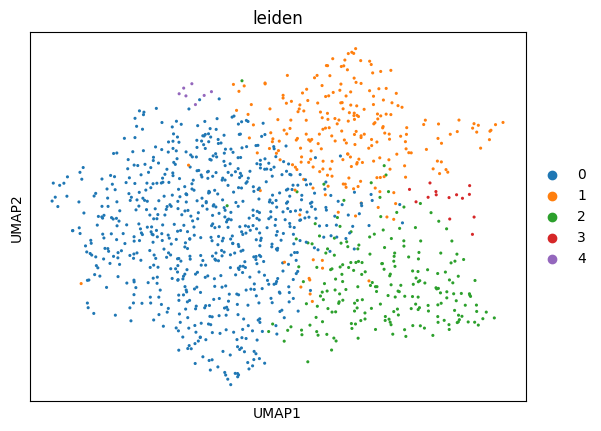

In [14]:
adata_contam_only = epithelial_cells[epithelial_cells.obs["cell_id"].isin(contaminated_unknown_ids)].copy()

sc.pp.scale(adata_contam_only)
sc.pp.pca(adata_contam_only)
sc.pp.neighbors(adata_contam_only)
sc.tl.leiden(adata_contam_only, resolution=0.5)  # puoi variare la risoluzione
sc.tl.umap(adata_contam_only)
sc.pl.umap(adata_contam_only, color="leiden", size=20)

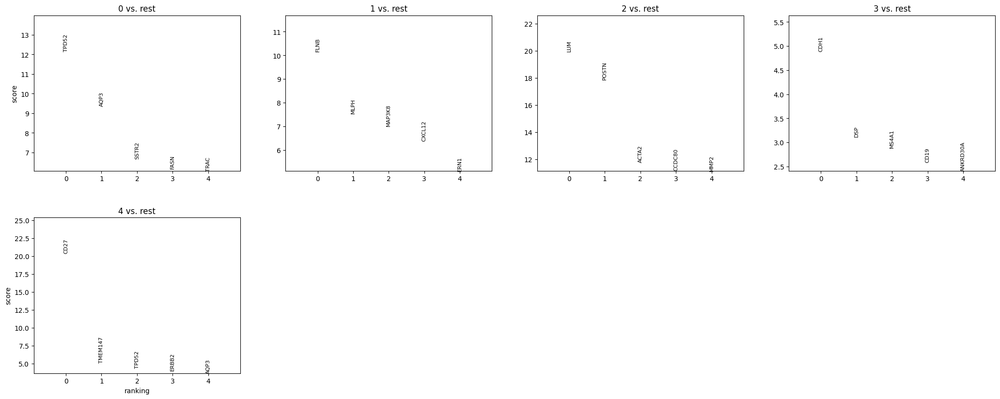

In [16]:
sc.tl.rank_genes_groups(adata_contam_only, groupby='leiden', method='t-test')  
sc.pl.rank_genes_groups(adata_contam_only, n_genes=5, sharey=False)  

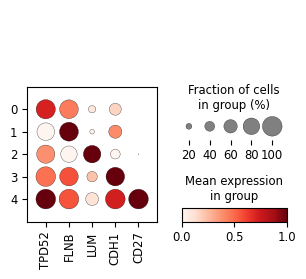

            TPD52      FLNB       LUM      CDH1       CD27
cluster                                                   
0        0.282461 -0.040264 -0.276436 -0.032837  -0.086605
1       -0.700046  0.572000 -0.412608  0.218696  -0.086605
2       -0.171805 -0.526454  1.408657 -0.215997   0.023653
3       -0.039985  0.099000 -0.001129  0.880316  -0.086605
4        0.677212  0.088880 -0.222802  0.583398  11.330763


In [17]:
marker_genes = ["TPD52", "FLNB", "LUM", "CDH1", "CD27"]  # add epithelial markers for comparison

# Dotplot to visualize average expression per cluster
sc.pl.dotplot(adata_contam_only, var_names=marker_genes, groupby="leiden", standard_scale="var")

# Subset the data only for the markers of interest and clusters
adata_sub = adata_contam_only[:, marker_genes]

# Create a DataFrame with expression and cluster info
expr_df = pd.DataFrame(
    adata_sub.X.toarray() if hasattr(adata_sub.X, "toarray") else adata_sub.X,
    columns=marker_genes,
    index=adata_sub.obs_names)
expr_df["cluster"] = adata_sub.obs["leiden"].values

# Calculate mean expression per gene in each cluster
mean_expr_per_cluster = expr_df.groupby("cluster").mean()

print(mean_expr_per_cluster)